In [132]:
import os
import json
import cv2
from PIL import Image, ImageDraw

import matplotlib
# matplotlib.use('nbagg')
import matplotlib.pyplot as plt
from IPython.display import display

base_dir = "/mnt/drive-d/anurag/roadwork/"
det_data_dir = os.path.join(base_dir, "scene")

### Visualization Code

In [133]:
PALLETE = [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
         (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
         (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30),
         (165, 42, 42), (255, 77, 255), (0, 226, 252), (182, 182, 255),
         (0, 82, 0), (120, 166, 157), (110, 76, 0), (174, 57, 255),
         (199, 100, 0), (72, 0, 118), (255, 179, 240), (0, 125, 92),
         (209, 0, 151), (188, 208, 182), (0, 220, 176), (255, 99, 164),
         (92, 0, 73), (133, 129, 255), (78, 180, 255), (0, 228, 0),
         (174, 255, 243), (45, 89, 255), (134, 134, 103), (145, 148, 174),
         (255, 208, 186), (197, 226, 255), (171, 134, 1), (109, 63, 54),
         (207, 138, 255), (151, 0, 95), (9, 80, 61), (84, 105, 51),
         (74, 65, 105), (166, 196, 102), (208, 195, 210), (255, 109, 65),
         (0, 143, 149), (179, 0, 194), (209, 99, 106), (5, 121, 0),
         (227, 255, 205), (147, 186, 208), (153, 69, 1), (3, 95, 161),
         (163, 255, 0), (119, 0, 170), (0, 182, 199), (0, 165, 120),
         (183, 130, 88), (95, 32, 0), (130, 114, 135), (110, 129, 133),
         (166, 74, 118), (219, 142, 185), (79, 210, 114), (178, 90, 62),
         (65, 70, 15), (127, 167, 115), (59, 105, 106), (142, 108, 45),
         (196, 172, 0), (95, 54, 80), (128, 76, 255), (201, 57, 1),
         (246, 0, 122), (191, 162, 208)]

class ROADWorkVisualizer(object):
    def __init__(self, anns):
        self.anns = anns

        self.categories = self.anns["categories"]
        self.names_colors =  [ (x['id'], x["name"], PALLETE[i]) for i, x in enumerate(self.categories) ]

    def open_image(self, image_cv2):
        image_cv2 = cv2.cvtColor(image_cv2, cv2.COLOR_BGR2RGB)
        # Open image
        img_open = Image.fromarray(image_cv2).convert("RGBA")
        # Create layer for bboxes and masks
        draw_layer = Image.new("RGBA", img_open.size, (255, 255, 255, 0))
        draw = ImageDraw.Draw(draw_layer)
        return img_open, draw_layer, draw

    def draw_objects(self, img_path, objects, alpha=127):
        img_cv2 = cv2.imread(img_path)
        img_open, draw_layer, draw = self.open_image(img_cv2)

        mask_objects = objects
        obj_colors = []
        for obj in mask_objects:
            cat_id = obj["category_id"]
            _, c = [ x[1:] for x in self.names_colors if x[0] == cat_id ][0]
            obj_colors.append(c)

        ## draw masks
        masks = [obj["segmentation"] for obj in mask_objects]
        for idx, (c, m) in enumerate(zip(obj_colors, masks)):
            alpha = alpha
            fill = tuple(list(c) + [alpha])
            outline = tuple(list(c) + [255])
            if isinstance(m, list):
                for m_ in m:
                    try:
                        if m_:
                            draw.polygon(m_, outline=fill, fill=fill, width=5)
                    except:
                        continue
            else:
                continue

        ## draw polylines
        poly_objects = objects
        poly_obj_colors = []
        for obj in poly_objects:
            cat_id = obj["category_id"]
            _, c = [ x[1:] for x in self.names_colors if x[0] == cat_id ][0]
            poly_obj_colors.append(c)
        try:
            polys = [ [ x["segmentation"], x["attributes"]["occluded"] ] for x in poly_objects]
        except:
            polys = [ [ x["segmentation"], False ] for x in poly_objects]
        for c, (poly, occluded) in zip(poly_obj_colors, polys):
            outline = tuple(list(c) + [255])
            try:
                for m in poly:
                    if m:
                        draw.polygon(m, outline=outline, fill=None, width=2)
            except:
                continue
        
        draw = self.draw_texts(draw, objects)

        composed_image = Image.alpha_composite(img_open, draw_layer)
        return composed_image

    def draw_text(self, position, name, draw, text_color=(255, 255, 255, 255)):
        text_bbox = draw.textbbox(position, name, font_size=11)
        draw.rectangle(text_bbox, fill=(0, 0, 0, 127))
        draw.text(position, name, fill=text_color, font_size=11)

    def draw_texts(self, draw, objects):
        for obj in objects:
            cat_id = obj["category_id"]
            name = [ x[1] for x in self.names_colors if x[0] == cat_id ][0]
            bbox = obj["bbox"]
            position = (bbox[0] + (bbox[2] * (1/4)), bbox[1] + (bbox[3] / 2))
            self.draw_text(position, name, draw)

            sign_image_text = ""
            if "sign_image" in obj["attributes"]:
                sign_image_text = obj["attributes"]["sign_image"] + " "
            if "sign_text" in obj["attributes"]:
                sign_image_text += obj["attributes"]["sign_text"]

            if sign_image_text != "":
                sign_position = (bbox[0] + (bbox[2] / 2), bbox[1] + (bbox[3] / 3))
                self.draw_text(sign_position, sign_image_text, draw, text_color=(255, 0, 0, 255))

        return draw

## Delving into Annotations JSON

As the annotations are in an extended COCO format, they work out of the box with almost any scene understanding framework.

In [134]:
data = os.path.join(det_data_dir, "annotations", "instances_train_gps_split.json")
with open(data, "r") as f:
    data = json.load(f)

### Let's look at the image information

The JSON behaves like COCO annotations, However, we have far more attributes that are likely to be useful. For example, every image has an associated scene description and scene level tags like the travel alteration, and the GPS location it was captured at.

In [135]:
im_info = data["images"][700]
img_path = os.path.join(det_data_dir, "images", im_info["file_name"])
from pprint import pprint
pprint(im_info)

{'city_name': 'minneapolis',
 'coco_url': '',
 'date_captured': 0,
 'file_name': 'minneapolis_8e8add44fdd3413f8539fe1415e2cec8_000000_21540.jpg',
 'flickr_url': '',
 'gps': [44.97931062, -93.27314698],
 'height': 1080,
 'id': 701,
 'license': 0,
 'scene_description': 'TTC signs and drum partially blocking right sidewalk. '
                      'Cone and drum partially blocking left sidewalk.',
 'scene_level_tags': {'daytime': 'Light',
                      'scene_environment': 'Urban',
                      'travel_alteration': ['Partially Blocked'],
                      'weather': ['Cloudy']},
 'video_info': {'frame_id': '21540.jpg',
                'seq_id': '000000',
                'vid_id': '8e8add44fdd3413f8539fe1415e2cec8'},
 'width': 1920}


### Lets visualize the objects

Apart from the COCO ground truth requirements (categories, masks), every object additionally has attributes associated with it, for example if it occluded or not. If it's a sign, the "sign_image" and "sign_text" provided the graphics and the text respectively. Or if it's an arrow board, the board state like "OFF", "LEFT", "RIGHT" are provided.

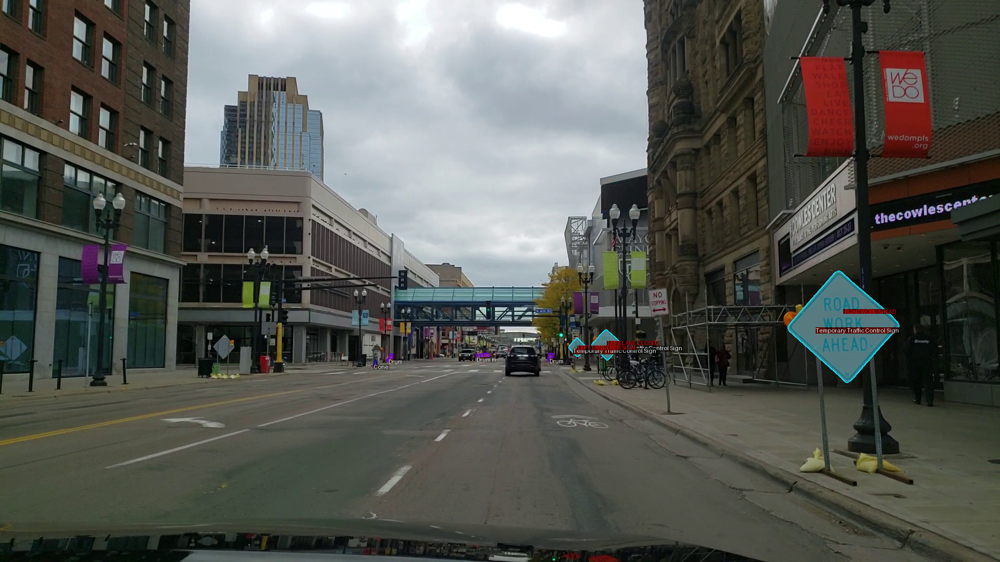

In [136]:
objects = [ x for x in data["annotations"] if x["image_id"] == im_info["id"] ]
categories = data["categories"]

vis = ROADWorkVisualizer(data)
composed_image = vis.draw_objects(img_path, objects)
display(composed_image)

## Let's filter and find interesting workzones

Let's try to find images which are partially blocked and have a lot of workzone objects.

In [137]:
selected_images = [] 
for x in data["images"]:
    if "travel_alteration" not in x["scene_level_tags"]:
        continue
    elif "Partially Blocked" in x["scene_level_tags"]["travel_alteration"]:
        selected_images.append(x)
print(f"There are {len(selected_images)} partially blocked images.")

selected_image_ids = [x["id"] for x in selected_images]
selected_anns = {}
for ann in data["annotations"]:
    if ann["image_id"] in selected_image_ids:
        if ann["image_id"] not in selected_anns:
            selected_anns[ann["image_id"]] = []
        selected_anns[ann["image_id"]].append(ann)
selected_images = sorted(selected_images, key=lambda x: len(selected_anns[x["id"]]), reverse=True)

There are 4454 partially blocked images.


Let's visualize the k'th image

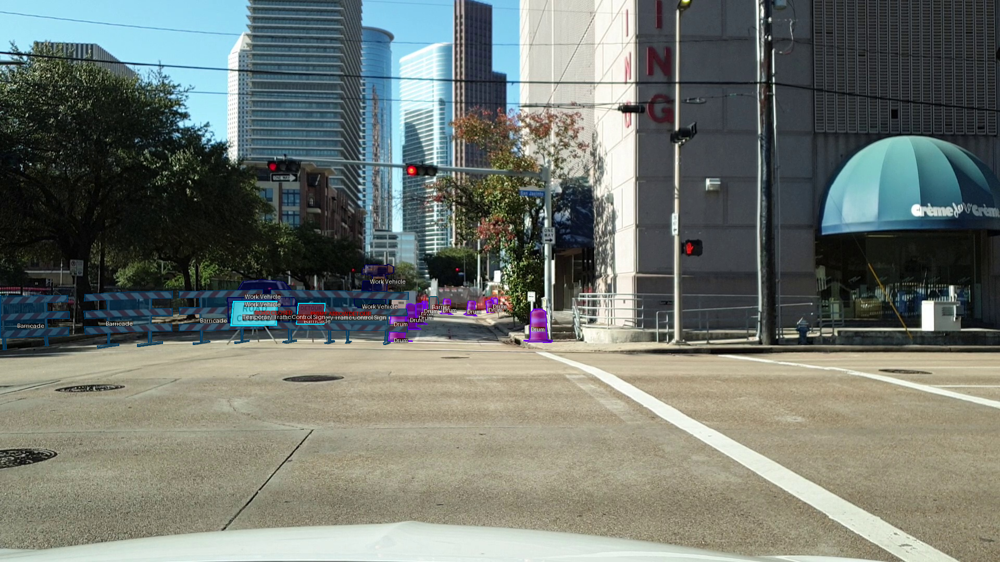

In [138]:
K = 40
img_path = os.path.join(det_data_dir, "images", selected_images[K]["file_name"])
objects = [ x for x in data["annotations"] if x["image_id"] == selected_images[K]["id"] ]
composed_image = vis.draw_objects(img_path, objects)
display(composed_image)

### Finding Geolocated Workzones

Let's try to find other partially blocked images which are taken close to this location.

In [139]:
!pip install geopy

2101.25s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


In [140]:
import geopy.distance


curr_gps = selected_images[K]["gps"]

images_within_500m = []
for i, x in enumerate(selected_images):
    if i == K:
        continue
    if "gps" not in x:
        continue
    dist = geopy.distance.distance(curr_gps, x["gps"]).m
    if dist < 500:
        images_within_500m.append((x, dist))

## Sort by distance
images_within_500m = sorted(images_within_500m, key=lambda x: x[1])
print(f"Images within 500m: {len(images_within_500m)}")
images_within_500m = [ x[0] for x in images_within_500m ] ## remove distance

Images within 500m: 4


Reference image: houston_dd814d73150447d2aea29a51928c3e76_000001_03450.jpg
Closest image: houston_af9c7da419f241029f5716264c954459_000002_14550.jpg


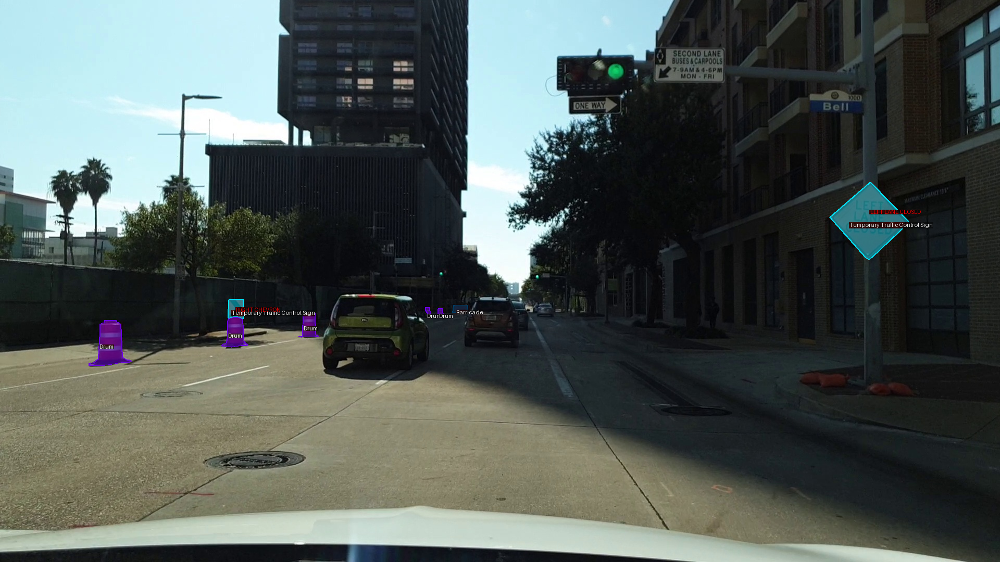

In [141]:
## closest image
print(f"Reference image: {selected_images[K]['file_name']}")
print(f"Closest image: {images_within_500m[0]['file_name']}")
img_path = os.path.join(det_data_dir, "images", images_within_500m[0]["file_name"])
objects = [ x for x in data["annotations"] if x["image_id"] == images_within_500m[0]["id"] ]
composed_image = vis.draw_objects(img_path, objects)
display(composed_image)

Reference image: houston_dd814d73150447d2aea29a51928c3e76_000001_03450.jpg
Closest image: houston_af9c7da419f241029f5716264c954459_000002_14550.jpg


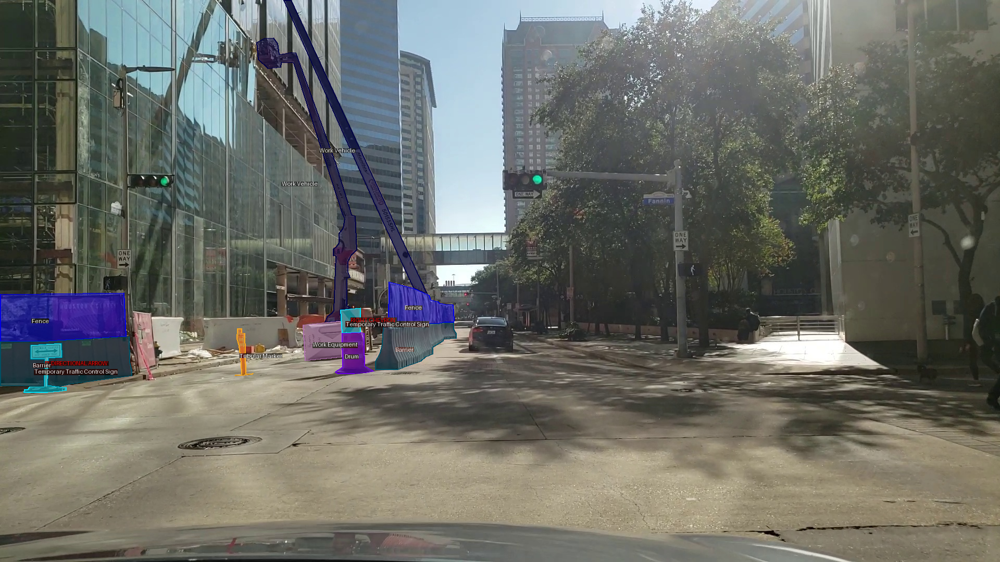

In [142]:
## furthest image in the set
print(f"Reference image: {selected_images[K]['file_name']}")
print(f"Closest image: {images_within_500m[0]['file_name']}")
img_path = os.path.join(det_data_dir, "images", images_within_500m[-1]["file_name"])
objects = [ x for x in data["annotations"] if x["image_id"] == images_within_500m[-1]["id"] ]
composed_image = vis.draw_objects(img_path, objects)
display(composed_image)